In [1]:
import numpy as np
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import seaborn as sns
from training_utils import load_image, Augment_Less
import pandas as pd

tf.keras.utils.set_random_seed(42)

# Load the Oxford-IIIT Pets dataset
dataset, info = tfds.load('oxford_iiit_pet:3.*.*', with_info=True)

TRAIN_LENGTH = info.splits['train'].num_examples
BATCH_SIZE = 64
BUFFER_SIZE = 1000
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE
EPOCHS = 40
OUTPUT_CLASSES = 3

train_images = dataset['train'].map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
test_images = dataset['test'].map(load_image, num_parallel_calls=tf.data.AUTOTUNE)

train_batches = (
    train_images
    .cache()
    .shuffle(BUFFER_SIZE)
    .batch(BATCH_SIZE)
    .repeat()
    .map(Augment_Less())
    .prefetch(buffer_size=tf.data.AUTOTUNE))

test_batches = test_images.batch(BATCH_SIZE)

2024-12-18 11:15:24.260785: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1 Max
2024-12-18 11:15:24.260805: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 64.00 GB
2024-12-18 11:15:24.260809: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 24.00 GB
2024-12-18 11:15:24.260839: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-12-18 11:15:24.260856: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [2]:
model = tf.keras.models.load_model('unet_models_pets_little_augmentation/model_batch_unet.keras')

In [3]:
import matplotlib.pyplot as plt
test_sample = next(iter(dataset["test"].take(1)))

def preprocess_image(image, target_size=(128, 128)):

    image = tf.image.resize(image, target_size)
    image = tf.cast(image, tf.float32) / 255.0  # Normalize to [0,1]
    return image

def visualize_prediction(model, image, mask):

    original_image = image.numpy().astype("uint8")  
    original_mask = tf.squeeze(mask, axis=-1).numpy() 


    input_image = preprocess_image(image) 
    input_batch = tf.expand_dims(input_image, axis=0)  

    # Run inference
    pred_logits = model.predict(input_batch)  
    pred_mask = tf.argmax(pred_logits, axis=-1) 
    pred_mask = tf.squeeze(pred_mask, axis=0)  

    original_size = tf.shape(original_image)[:2] 
    pred_mask_resized = tf.image.resize(
        tf.expand_dims(pred_mask, axis=-1),
        size=original_size,
        method=tf.image.ResizeMethod.NEAREST_NEIGHBOR
    )
    pred_mask_resized = tf.squeeze(pred_mask_resized, axis=-1).numpy()  
    # Visualization
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Original Image
    axes[0].imshow(original_image)
    axes[0].set_title("Original Image")
    axes[0].axis("off")

    # Ground Truth Mask
    axes[1].imshow(original_mask, cmap="jet")
    axes[1].set_title("Ground Truth Mask")
    axes[1].axis("off")

    # Predicted Mask
    axes[2].imshow(pred_mask_resized, cmap="jet")
    axes[2].set_title("Predicted Mask (Resized)")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()
    plt.close()

    plt.imshow(pred_mask_resized)
    plt.axis("off")
    plt.show()
    plt.close()

Visualizing Sample 1:
1/1 [==============================] - 0s 292ms/step


2024-12-18 11:15:26.574802: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


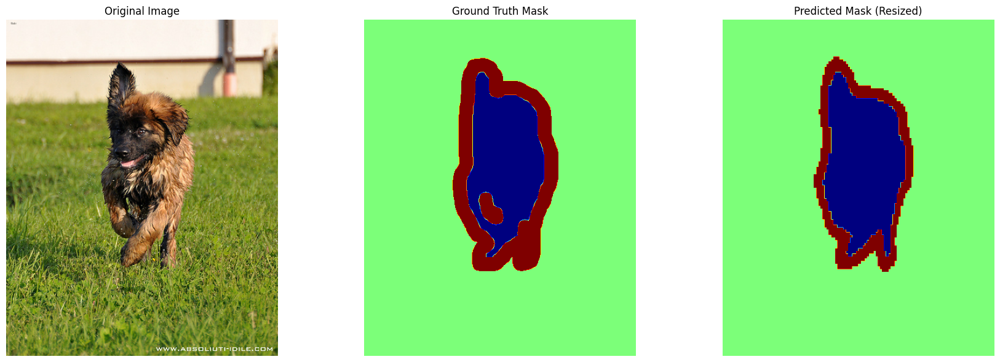

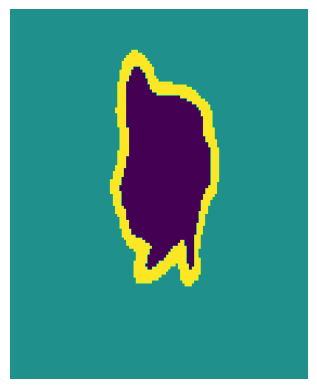

Visualizing Sample 2:
1/1 [==============================] - 0s 29ms/step


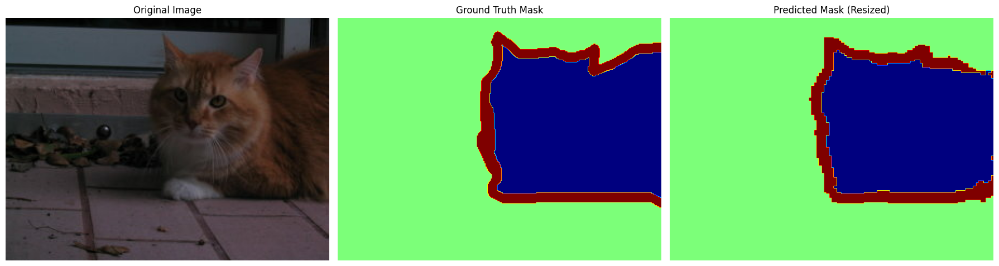

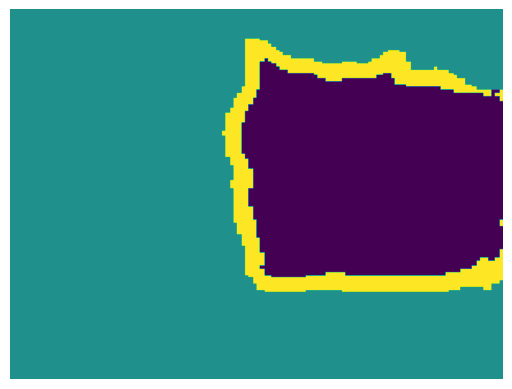

Visualizing Sample 3:
1/1 [==============================] - 0s 29ms/step


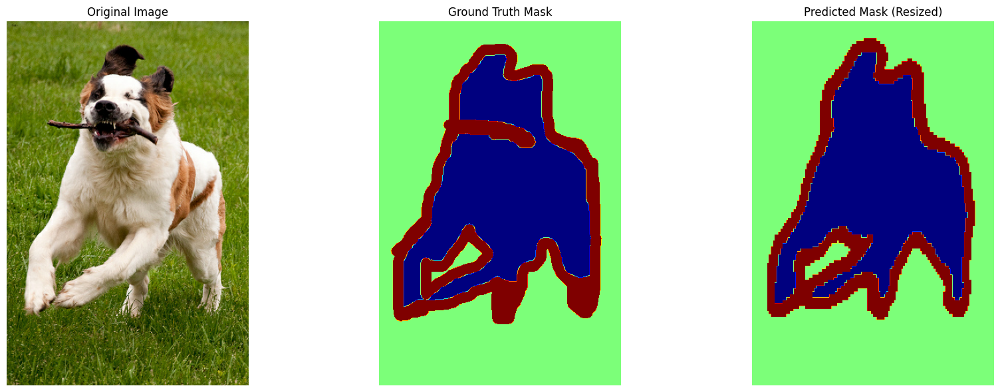

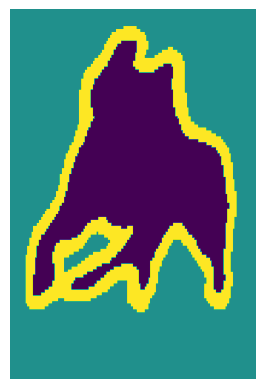

Visualizing Sample 4:
1/1 [==============================] - 0s 29ms/step


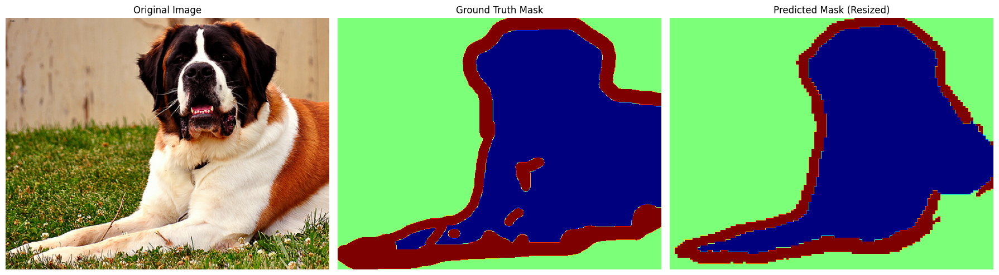

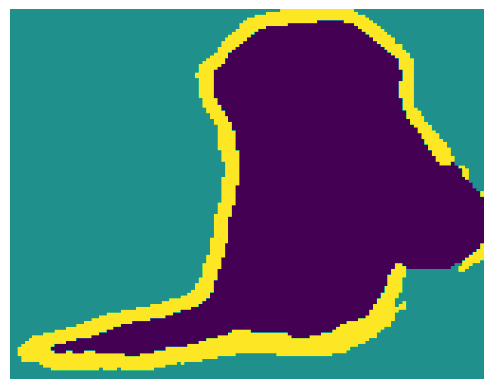

Visualizing Sample 5:
1/1 [==============================] - 0s 30ms/step


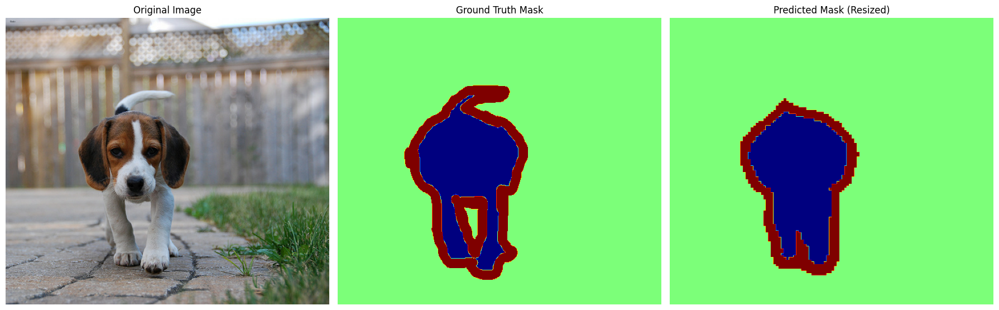

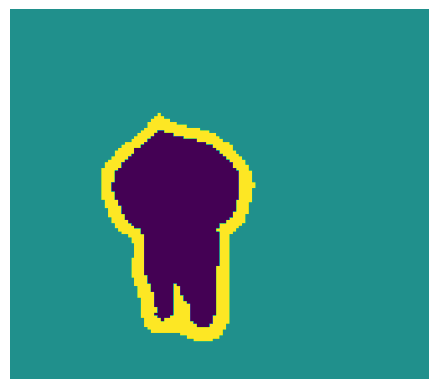

Visualizing Sample 6:
1/1 [==============================] - 0s 29ms/step


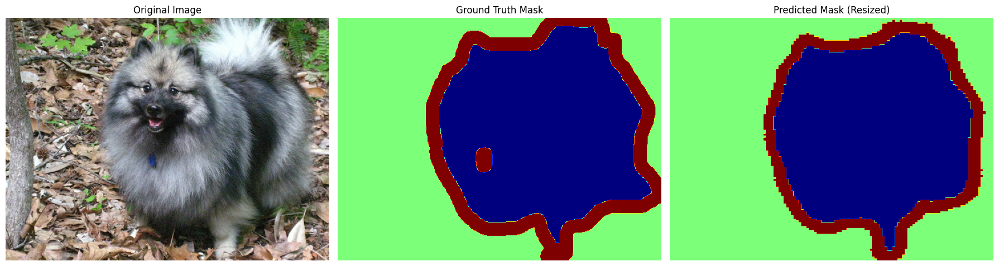

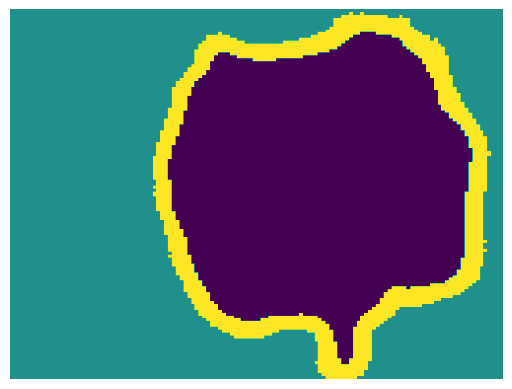

Visualizing Sample 7:
1/1 [==============================] - 0s 28ms/step


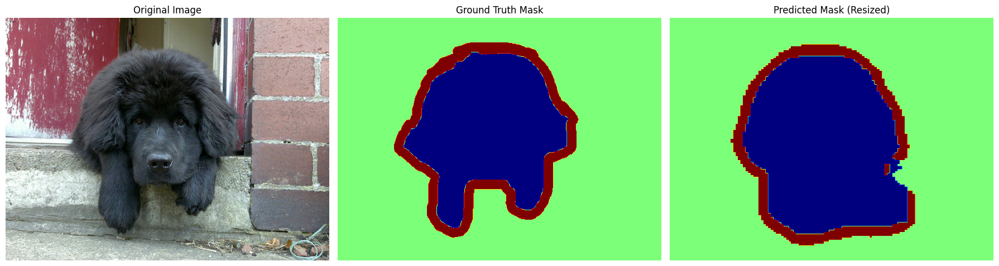

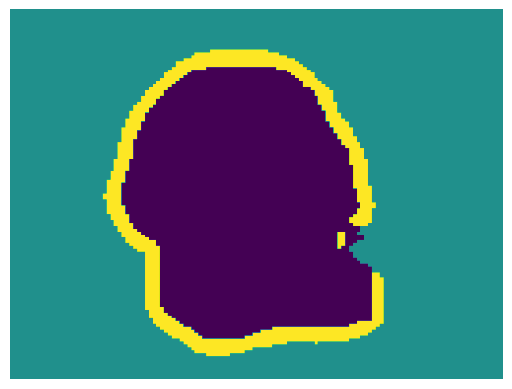

Visualizing Sample 8:
1/1 [==============================] - 0s 29ms/step


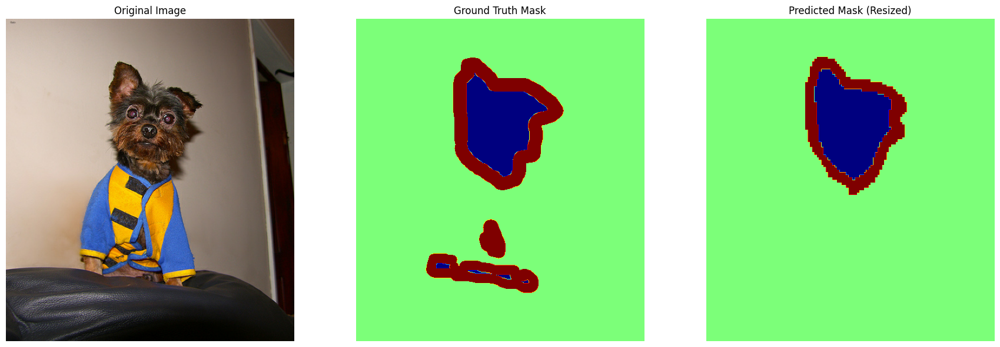

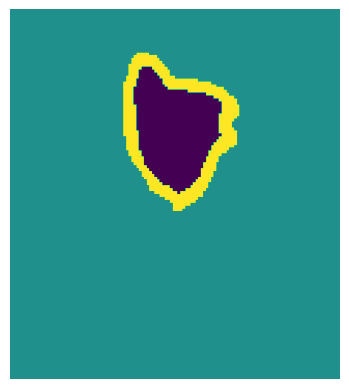

Visualizing Sample 9:
1/1 [==============================] - 0s 29ms/step


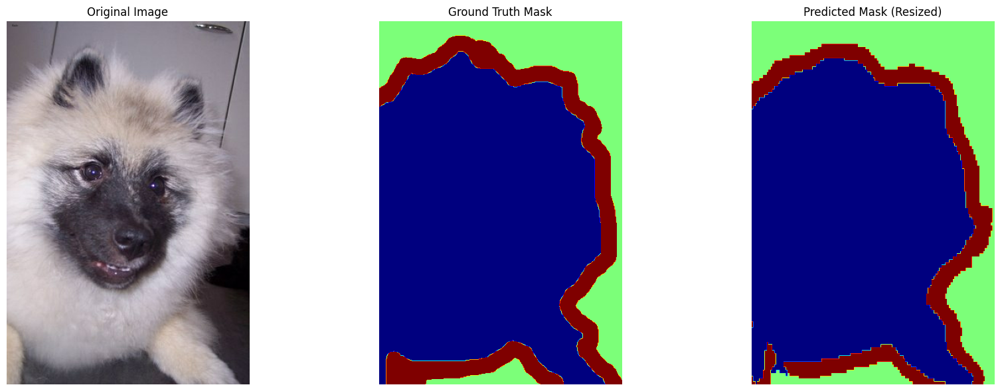

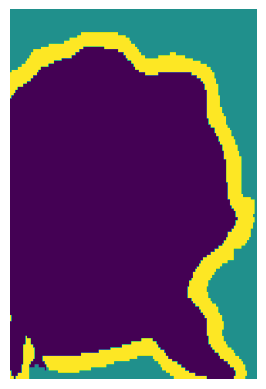

Visualizing Sample 10:
1/1 [==============================] - 0s 28ms/step


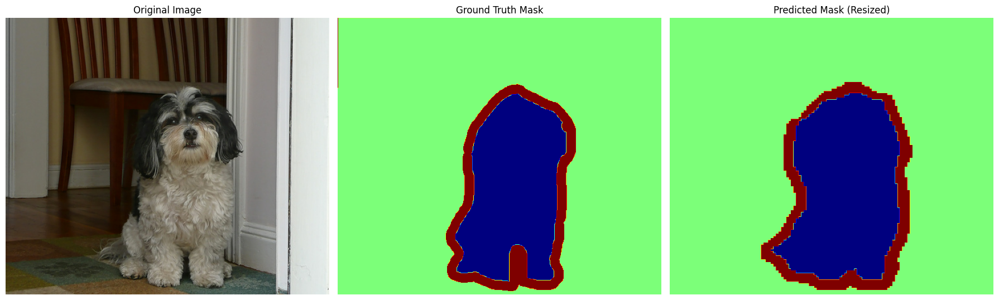

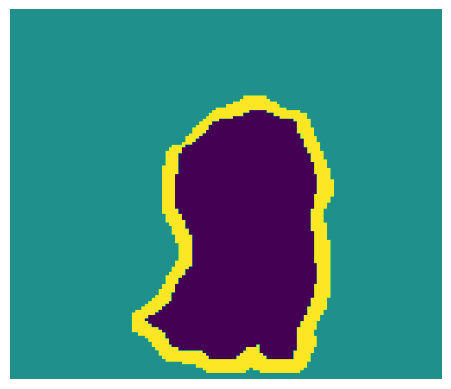

In [4]:
num_samples = 10
test_samples = dataset["test"].take(num_samples)
for idx, test_sample in enumerate(test_samples, start=1):
    image = test_sample['image']
    mask = test_sample['segmentation_mask']
    print(f"Visualizing Sample {idx}:")
    visualize_prediction(model, image, mask)

In [5]:
model = tf.keras.models.load_model('fcn_model_pet_less_augmentation/model_fcn_batch.keras')

Visualizing Sample 1:
1/1 [==============================] - 0s 325ms/step


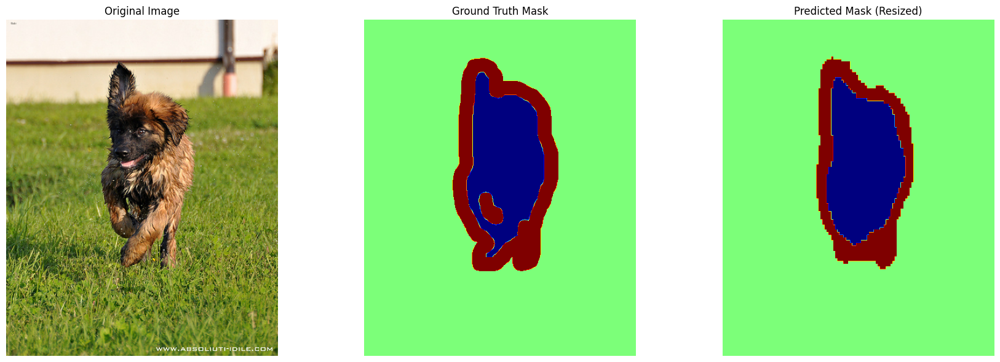

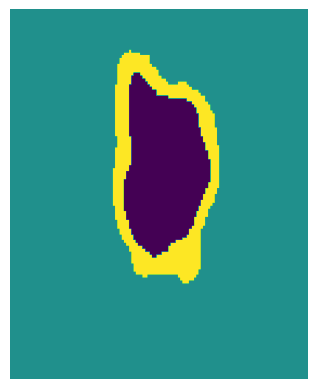

Visualizing Sample 2:
1/1 [==============================] - 0s 13ms/step


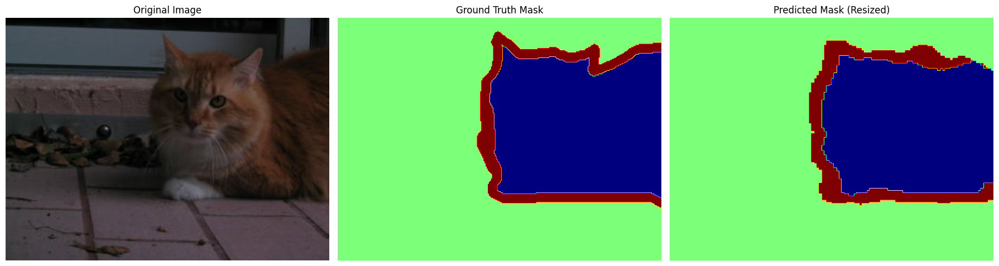

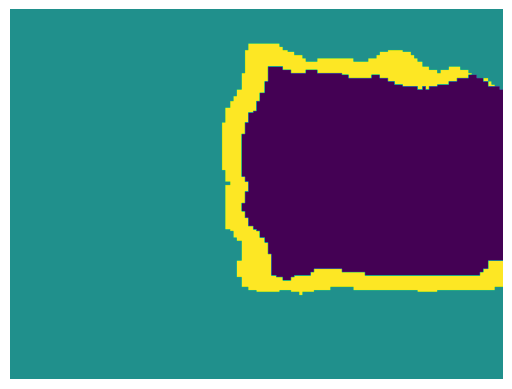

Visualizing Sample 3:
1/1 [==============================] - 0s 14ms/step


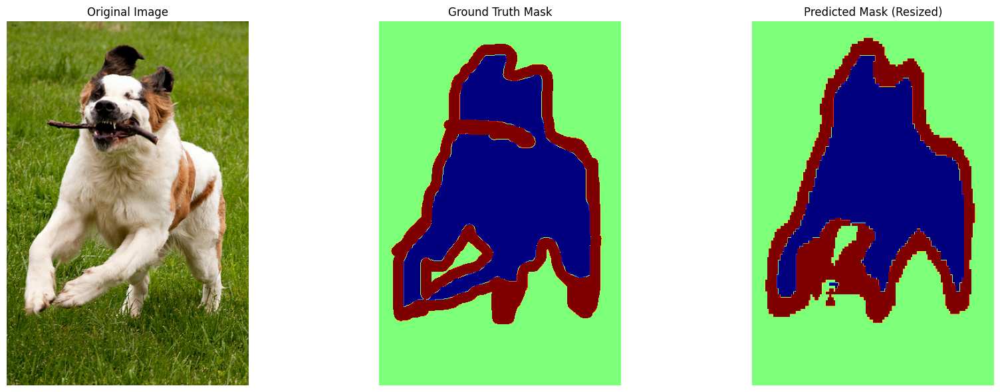

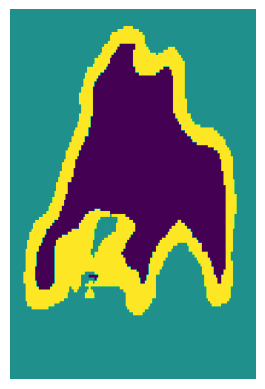

Visualizing Sample 4:
1/1 [==============================] - 0s 13ms/step


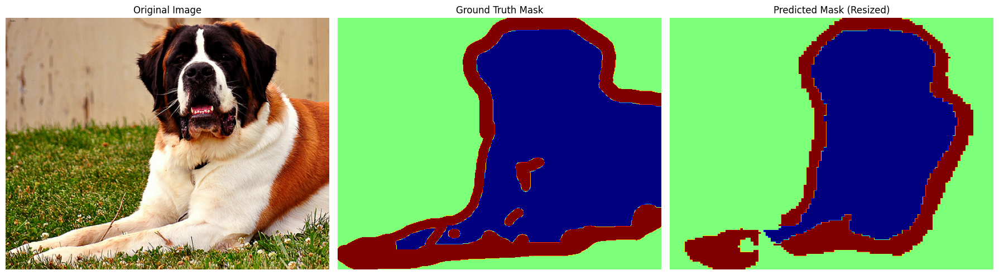

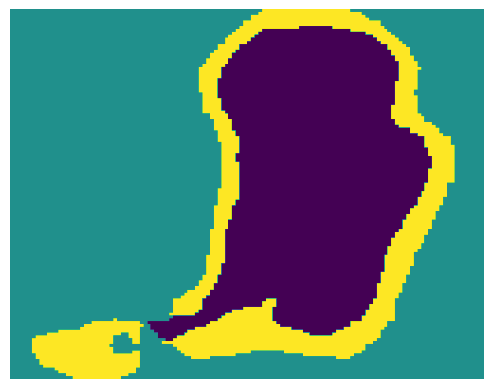

Visualizing Sample 5:
1/1 [==============================] - 0s 14ms/step


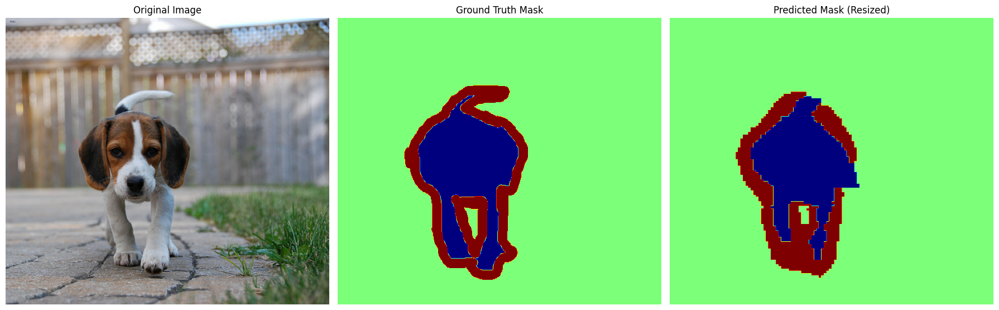

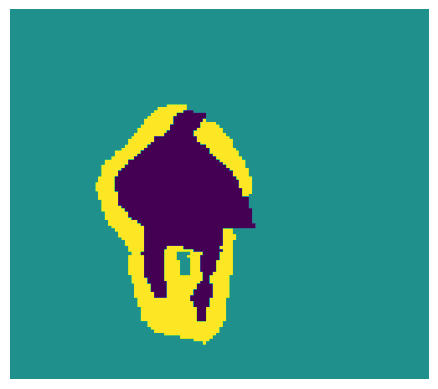

Visualizing Sample 6:
1/1 [==============================] - 0s 13ms/step


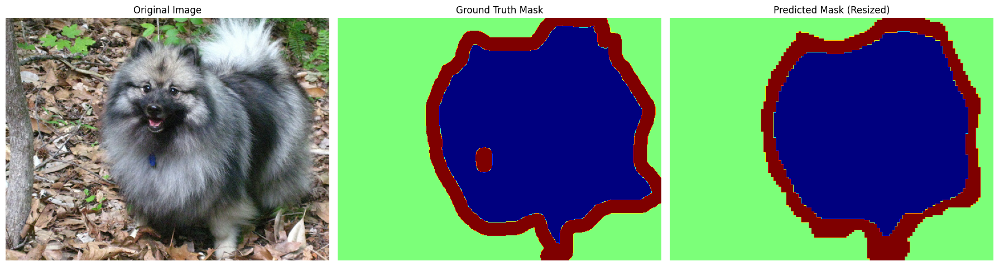

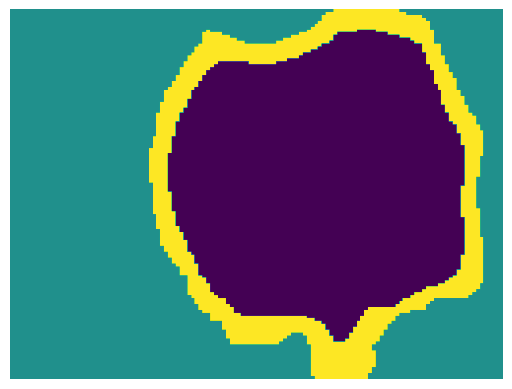

Visualizing Sample 7:
1/1 [==============================] - 0s 14ms/step


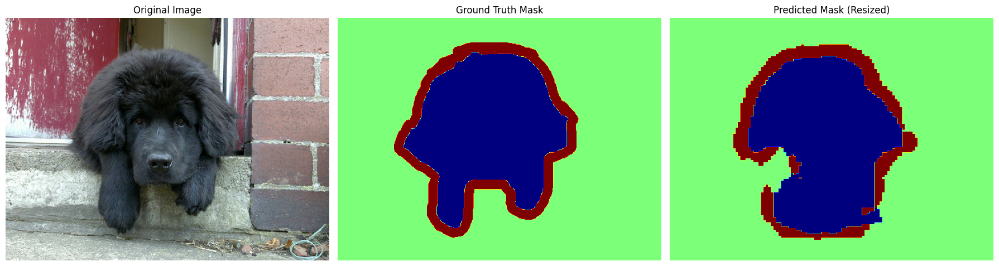

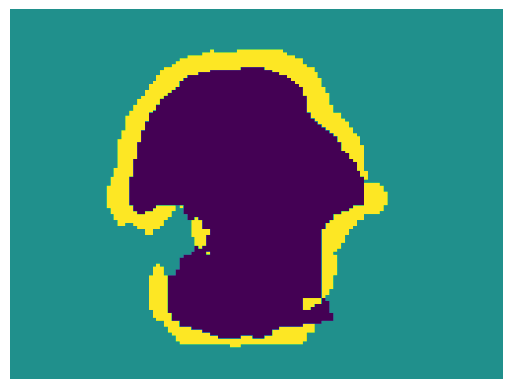

Visualizing Sample 8:
1/1 [==============================] - 0s 16ms/step


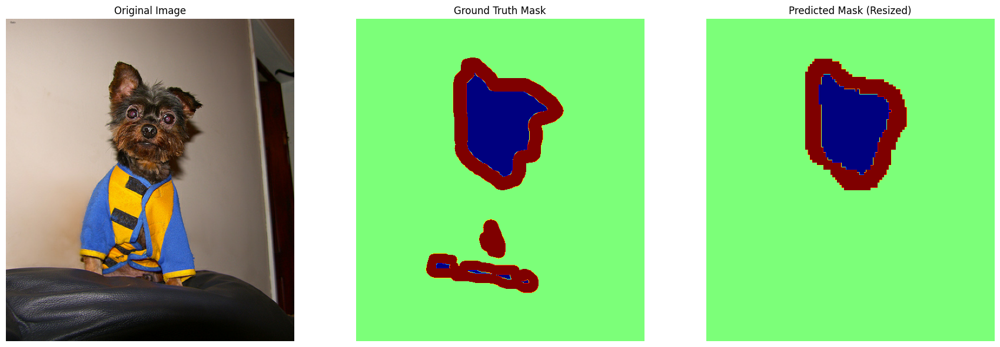

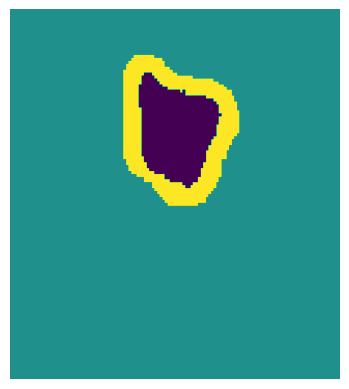

Visualizing Sample 9:
1/1 [==============================] - 0s 13ms/step


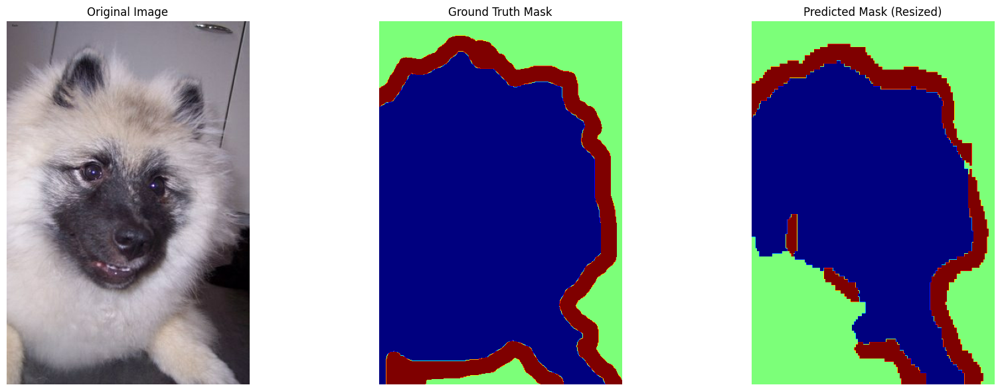

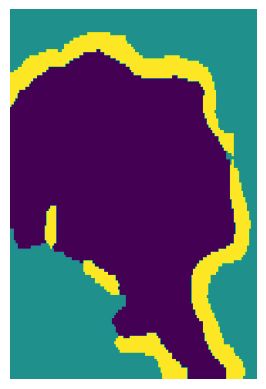

Visualizing Sample 10:
1/1 [==============================] - 0s 13ms/step


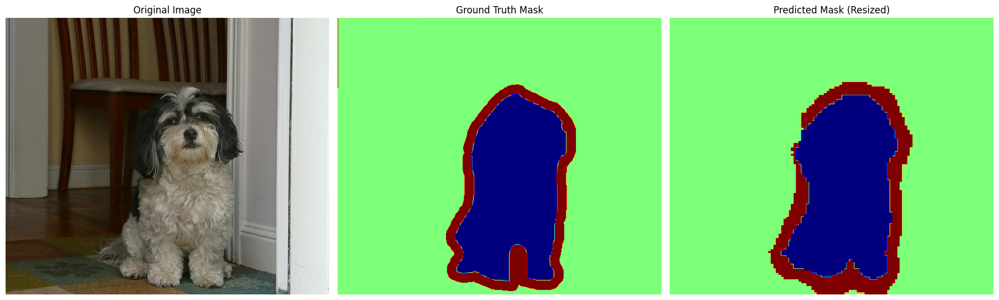

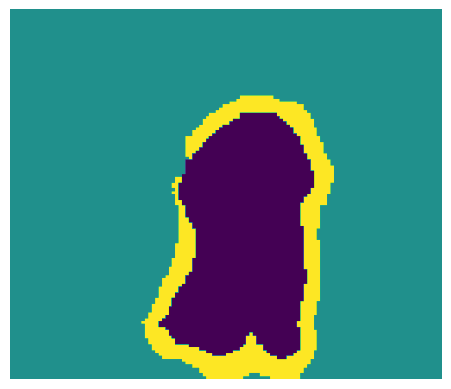

In [ ]:
num_samples = 10
test_samples = dataset["test"].take(num_samples)
for idx, test_sample in enumerate(test_samples, start=1):
    image = test_sample['image']
    mask = test_sample['segmentation_mask']
    print(f"Visualizing Sample {idx}:")
    visualize_prediction(model, image, mask)